"C:\Users\SANKET\Downloads\dataset.csv"

In [2]:
import pandas as pd
import plotly.express as px

In [3]:
df=pd.read_csv(r"C:\Users\SANKET\Downloads\dataset.csv")

In [3]:
df.shape

(112634, 17)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [7]:
# Checking for null values in each column

null_values = df.isnull().sum()
print(null_values)


VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                      24
Electric Utility                                     443
2020 Census Tract                                      0
dtype: int64


In [8]:
import numpy as np
df['Model'] = df.groupby('Make')['Model'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else 'NOT SPECIFIED'))
# Replacing null values in 'Legislative District' with -1
df['Legislative District'] = df['Legislative District'].replace(to_replace=np.nan, value=-1)
# Handled null values in 'Vehicle Location', assigning '0,0' where missing
df['Vehicle Location'] = df.apply(lambda row: '0,0' if pd.isna(row['Vehicle Location']) else row['Vehicle Location'], axis=1)
# Fill missing 'Electric Utility' values with 'NOT AVAILABLE'
df['Electric Utility'] = df['Electric Utility'].fillna('NOT AVAILABLE')


In [9]:
# Checking for null values after above execution in each column
null_values = df.isnull().sum()

# Display the null values
print(null_values)

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64


In [10]:
df.describe

<bound method NDFrame.describe of         VIN (1-10)     County           City State  Postal Code  Model Year  \
0       JTMEB3FV6N     Monroe       Key West    FL        33040        2022   
1       1G1RD6E45D      Clark       Laughlin    NV        89029        2013   
2       JN1AZ0CP8B     Yakima         Yakima    WA        98901        2011   
3       1G1FW6S08H     Skagit       Concrete    WA        98237        2017   
4       3FA6P0SU1K  Snohomish        Everett    WA        98201        2019   
...            ...        ...            ...   ...          ...         ...   
112629  7SAYGDEF2N       King         Duvall    WA        98019        2022   
112630  1N4BZ1CP7K   San Juan  Friday Harbor    WA        98250        2019   
112631  1FMCU0KZ4N       King         Vashon    WA        98070        2022   
112632  KNDCD3LD4J       King      Covington    WA        98042        2018   
112633  YV4BR0CL8N       King      Covington    WA        98042        2022   

             Make

In [11]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,-1.0,198968248,POINT (-81.80023 24.5545),NOT AVAILABLE,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,-1.0,5204412,POINT (-114.57245 35.16815),NOT AVAILABLE,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [12]:

df.describe()


,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112634.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.727382,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.763497,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,-1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


**Task 1**
* This is an open ended problem. 
* Apply Exploratory Data Analysis
* (Univariate and Bivariate) on the dataset available above.

# Univariate Analysis

Distribution of Electric Vehicle Makes: how many different vehicle brands are present and their counts.

Distribution of Electric Vehicle Makes:
Make
TESLA             52078
NISSAN            12880
CHEVROLET         10182
FORD               5819
BMW                4680
KIA                4483
TOYOTA             4405
VOLKSWAGEN         2514
AUDI               2332
VOLVO              2288
CHRYSLER           1794
HYUNDAI            1412
JEEP               1152
RIVIAN              885
FIAT                822
PORSCHE             818
HONDA               792
MINI                632
MITSUBISHI          588
POLESTAR            558
MERCEDES-BENZ       506
SMART               273
JAGUAR              219
LINCOLN             168
CADILLAC            108
LUCID MOTORS         65
SUBARU               59
LAND ROVER           38
LEXUS                33
FISKER               20
GENESIS              18
AZURE DYNAMICS        7
TH!NK                 3
BENTLEY               3
Name: count, dtype: int64


<Axes: title={'center': 'Distribution of Electric Vehicle Makes'}, xlabel='Make'>

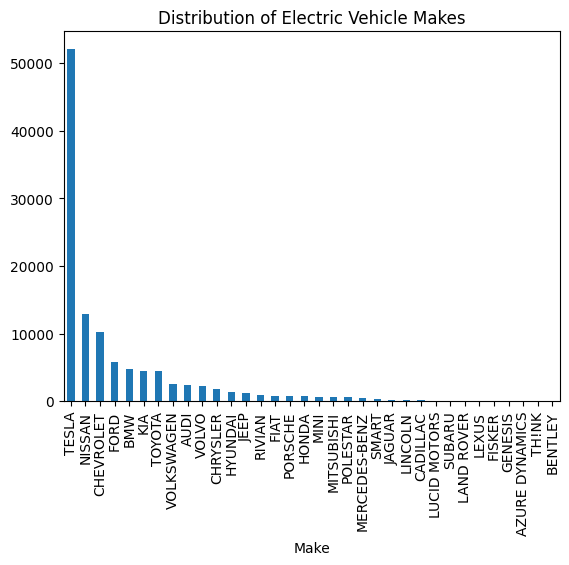

In [14]:
make_counts = df['Make'].value_counts()
print("Distribution of Electric Vehicle Makes:")
print(make_counts)
make_counts.plot(kind='bar', title='Distribution of Electric Vehicle Makes')

# Top 5 ev makes 
* TESLA             52078
* NISSAN            12880
* CHEVROLET         10182
* FORD               5819
* BMW                4680

Distribution of Electric Vehicle Types:

BEV And PHEV

In [16]:
import plotly.express as px
vehicle_type_count = df.groupby('Electric Vehicle Type')['VIN (1-10)'].count().reset_index()
vehicle_type_count.columns = ['Electric Vehicle Type', 'Count']
fig = px.pie(vehicle_type_count,
             names='Electric Vehicle Type',
             values='Count',
             title="Distribution of Electric Vehicles by Type",
             labels={'Electric Vehicle Type': 'EV Type', 'Count': 'Number of Vehicles'},
             color_discrete_sequence=px.colors.qualitative.Set1)
fig.show()


**Insights**
* 76% of the EV's are Battery Electric Vehicles

Electric Range Distribution: 
What are the range of different electric vehicles?

<Axes: title={'center': 'Electric Range Distribution'}, ylabel='Frequency'>

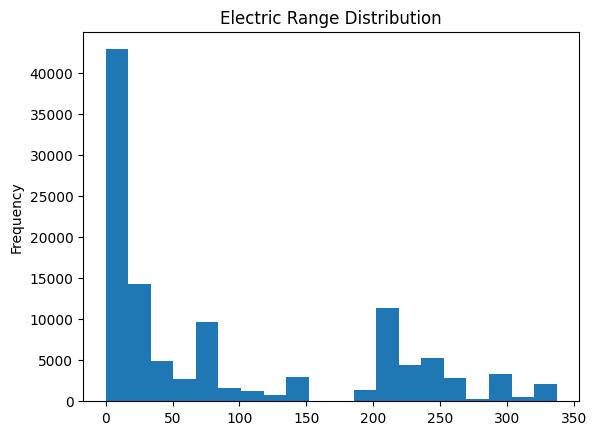

In [18]:
df['Electric Range'].plot(kind='hist', bins=20, title='Electric Range Distribution')


**Model Year Distribution**
* What is the distribution of electric vehicle model years?

<Axes: title={'center': 'Electric Vehicle Model Year Distribution'}, ylabel='Frequency'>

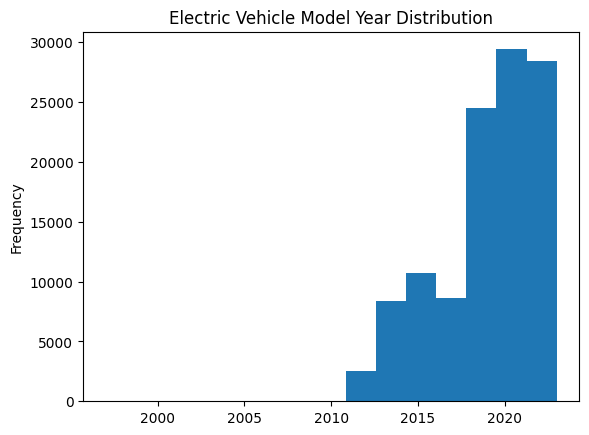

In [19]:
df['Model Year'].plot(kind='hist', bins=15, title='Electric Vehicle Model Year Distribution')


**Insights**
* The most electric vehicles are manufactured after 2010.
* The histogram is a left skewed histogram.

Clean Alternative Fuel Vehicle (CAFV) Eligibility
how many vehicles are CAFV-eligible ?

In [17]:
unique_cafv_eligibility = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].unique()
print(unique_cafv_eligibility)


['Clean Alternative Fuel Vehicle Eligible'
 'Not eligible due to low battery range'
 'Eligibility unknown as battery range has not been researched']


In [21]:
import plotly.express as px

cafv_count = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts().reset_index()
cafv_count.columns = ['CAFV Eligibility', 'Count']
fig = px.pie(cafv_count, 
             names='CAFV Eligibility', 
             values='Count', 
             title="Distribution of CAFV Eligibility",
             labels={'CAFV Eligibility': 'CAFV Eligibility', 'Count': 'Number of Vehicles'})
fig.show()

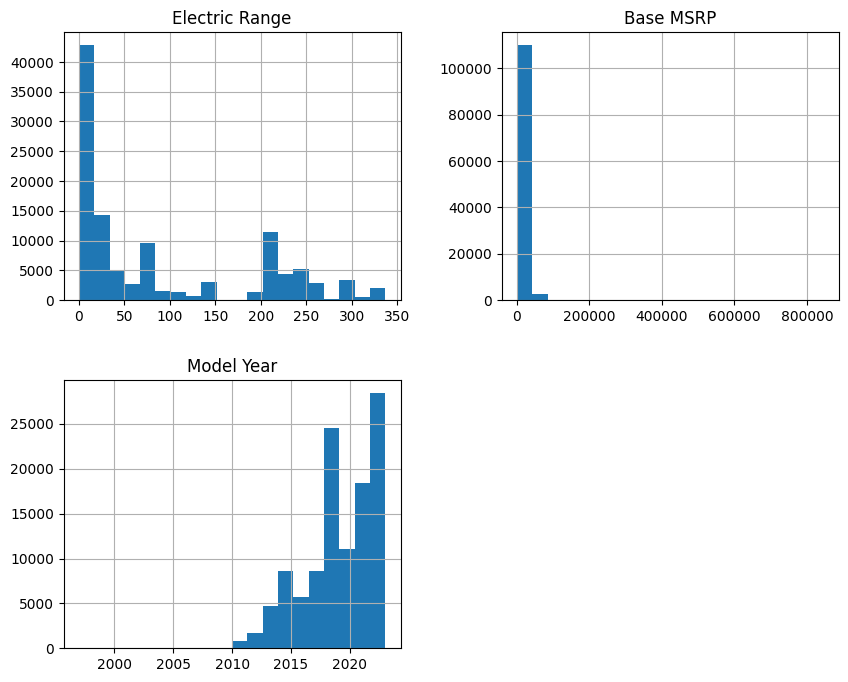

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

numeric_columns = ['Electric Range', 'Base MSRP', 'Model Year']
df[numeric_columns].describe()

df[numeric_columns].hist(bins=20, figsize=(10, 8))
plt.show()


**Skewness of the distribution**
* Electric Range is right-skewed.
* Base MSRP is right-skewed.
* Model Year is left-skewed.

       Electric Range      Base MSRP     Model Year
count   112634.000000  112634.000000  112634.000000
mean        87.812987    1793.439681    2019.003365
std        102.334216   10783.753486       2.892364
min          0.000000       0.000000    1997.000000
25%          0.000000       0.000000    2017.000000
50%         32.000000       0.000000    2020.000000
75%        208.000000       0.000000    2022.000000
max        337.000000  845000.000000    2023.000000


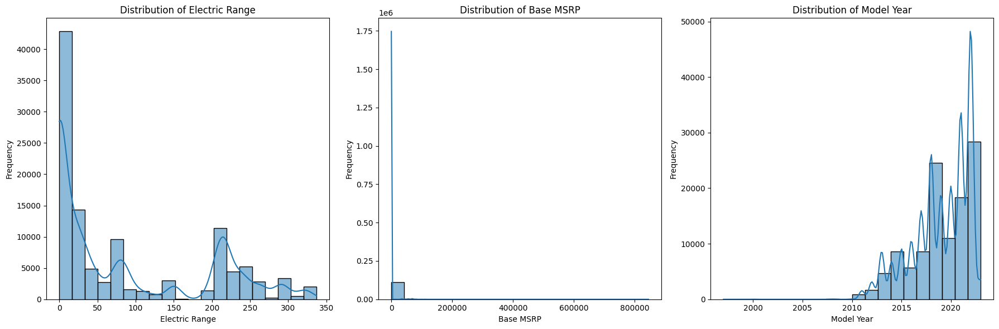

INSIGHTS
Skewness of numeric columns:
Electric Range     0.817103
Base MSRP         10.100497
Model Year        -0.817579
dtype: float64
Electric Range is right-skewed.
Base MSRP is right-skewed.
Model Year is left-skewed.


In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

numeric_columns = ['Electric Range', 'Base MSRP', 'Model Year']
description = df[numeric_columns].describe()

print(description)
fig, axes = plt.subplots(nrows=1, ncols=len(numeric_columns), figsize=(18, 6))
for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], bins=20, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()
print("INSIGHTS")
skewness = df[numeric_columns].skew()
print("Skewness of numeric columns:")
print(skewness)

for column in numeric_columns:
    if skewness[column] < -0.5:
        print(f"{column} is left-skewed.")
    elif skewness[column] > 0.5:
        print(f"{column} is right-skewed.")
    else:
        print(f"{column} is approximately symmetric.")


**Univariate Analysis for Categorical Columns**


Make value counts:
 Make
TESLA             52078
NISSAN            12880
CHEVROLET         10182
FORD               5819
BMW                4680
KIA                4483
TOYOTA             4405
VOLKSWAGEN         2514
AUDI               2332
VOLVO              2288
CHRYSLER           1794
HYUNDAI            1412
JEEP               1152
RIVIAN              885
FIAT                822
PORSCHE             818
HONDA               792
MINI                632
MITSUBISHI          588
POLESTAR            558
MERCEDES-BENZ       506
SMART               273
JAGUAR              219
LINCOLN             168
CADILLAC            108
LUCID MOTORS         65
SUBARU               59
LAND ROVER           38
LEXUS                33
FISKER               20
GENESIS              18
AZURE DYNAMICS        7
TH!NK                 3
BENTLEY               3
Name: count, dtype: int64

Model value counts:
 Model
MODEL 3        23135
MODEL Y        17142
LEAF           12880
MODEL S         7377
BOLT EV         4910

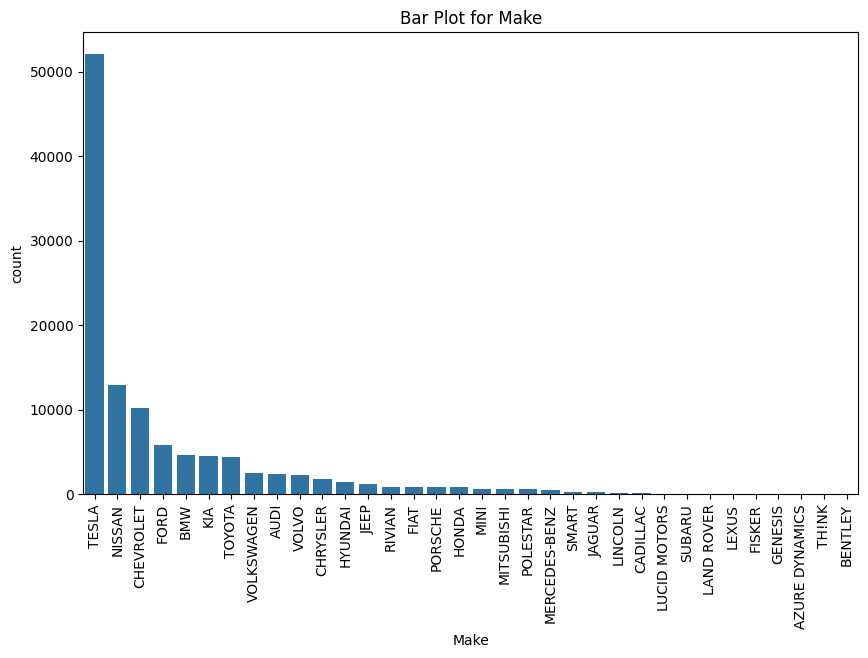

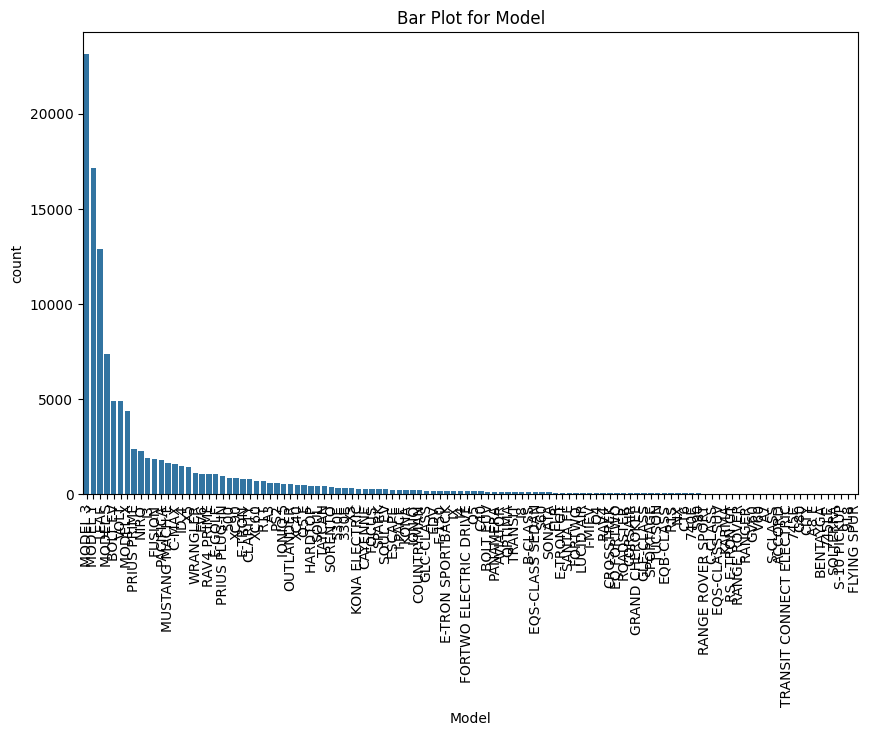

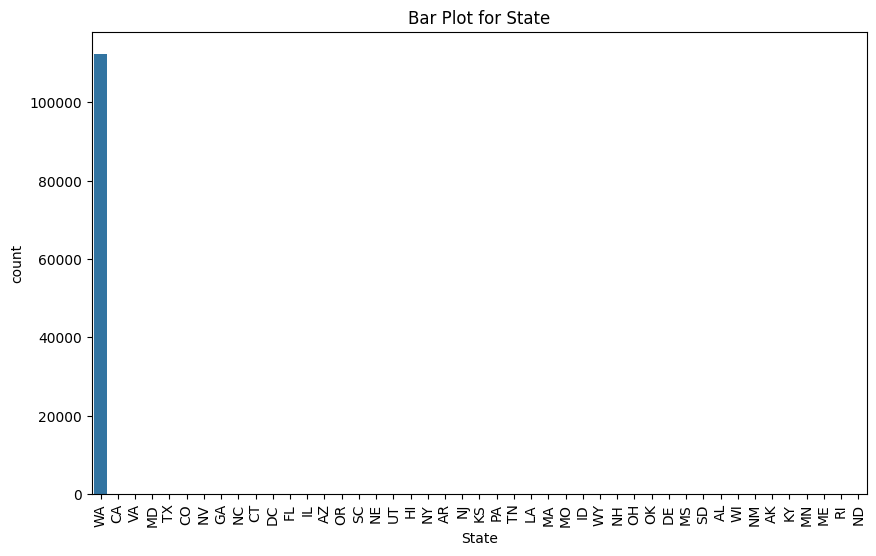

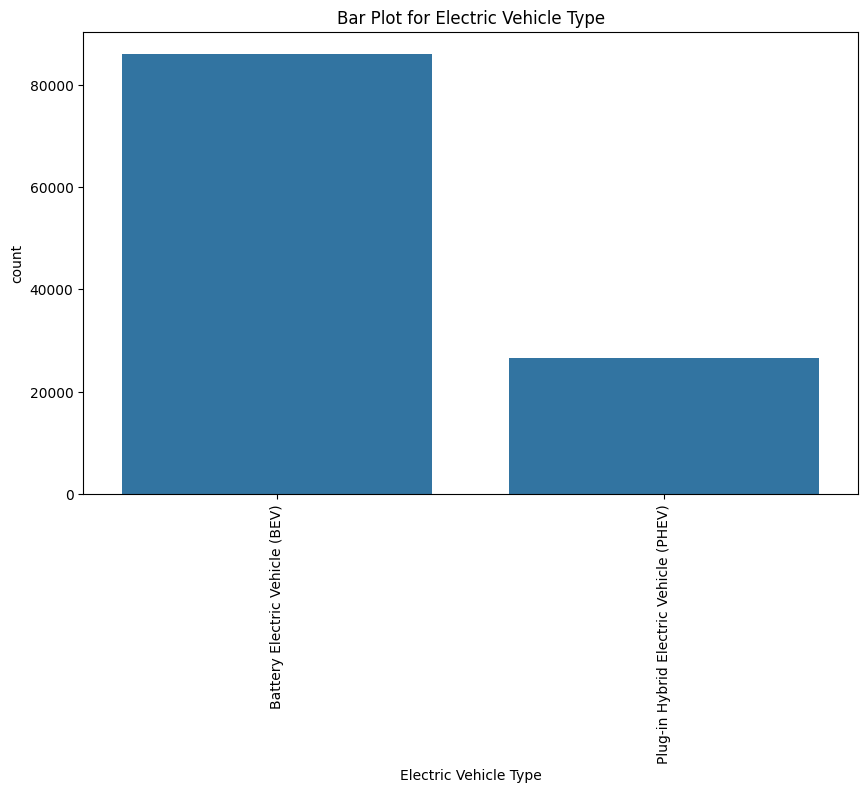

In [36]:

categorical_columns = ['Make', 'Model', 'State', 'Electric Vehicle Type']
for col in categorical_columns:
    print(f"\n{col} value counts:\n", df[col].value_counts())

# Bar plots for Categorical Columns
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.title(f'Bar Plot for {col}')
    plt.xticks(rotation=90)
    plt.show()

# Bivariate Analysis

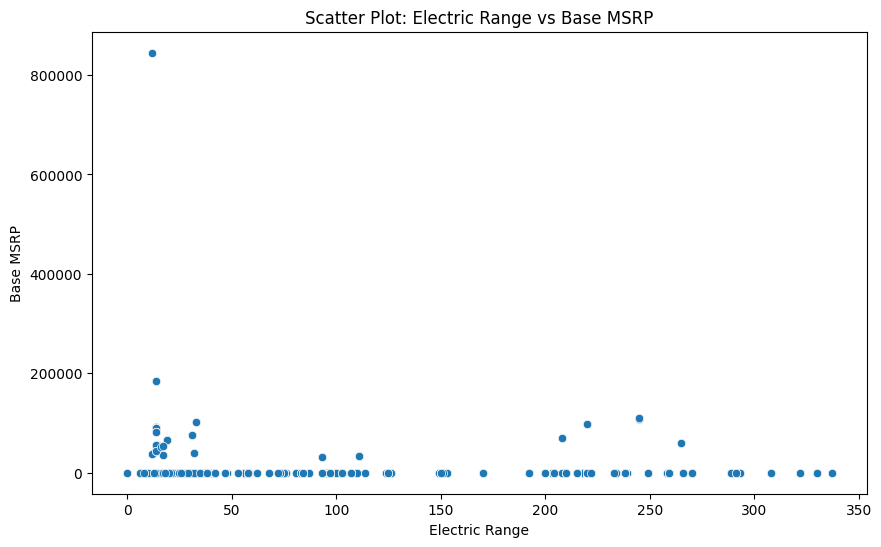

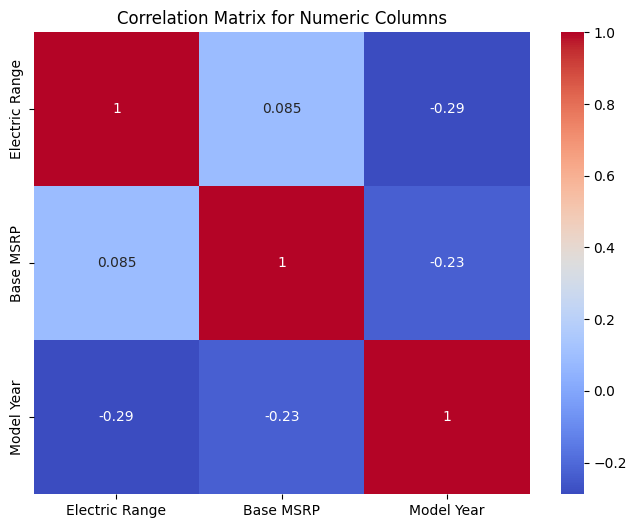

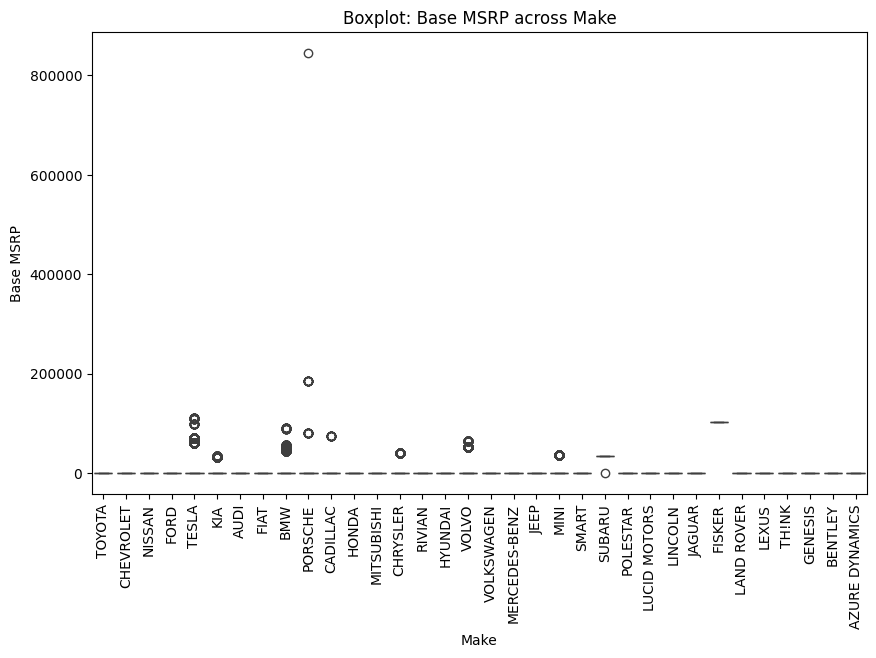


Cross-tabulation:
 Electric Vehicle Type  Battery Electric Vehicle (BEV)  \
Make                                                    
AUDI                                             1126   
AZURE DYNAMICS                                      7   
BENTLEY                                             0   
BMW                                               905   
CADILLAC                                            0   
CHEVROLET                                        5286   
CHRYSLER                                            0   
FIAT                                              822   
FISKER                                              0   
FORD                                             2179   
GENESIS                                            18   
HONDA                                               0   
HYUNDAI                                          1095   
JAGUAR                                            219   
JEEP                                                0   
KIA        

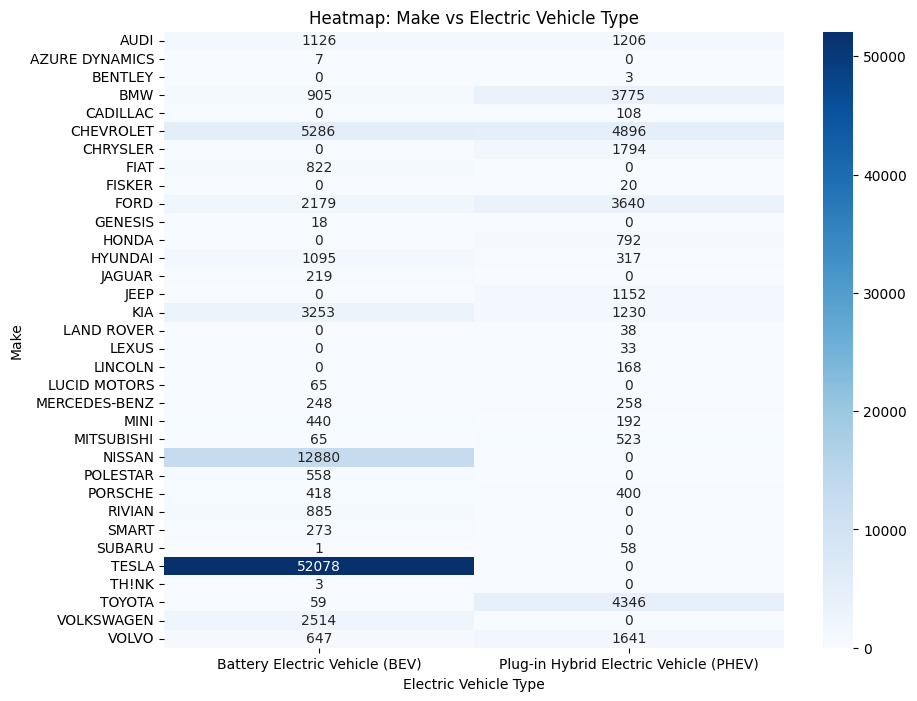

In [5]:
# (Numeric-Numeric)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Electric Range', y='Base MSRP')
plt.title('Scatter Plot: Electric Range vs Base MSRP')
plt.show()

# Correlation Matrix
corr_matrix = df[numeric_columns].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix for Numeric Columns')
plt.show()

#(Numeric-Categorical)
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Make', y='Base MSRP')
plt.title('Boxplot: Base MSRP across Make')
plt.xticks(rotation=90)
plt.show()

#(Categorical-Categorical)
cross_tab = pd.crosstab(df['Make'], df['Electric Vehicle Type'])
print("\nCross-tabulation:\n", cross_tab)

# Heatmap for Categorical-Categorical
plt.figure(figsize=(10, 8))
sns.heatmap(cross_tab, annot=True, cmap='Blues', fmt='d')
plt.title('Heatmap: Make vs Electric Vehicle Type')
plt.show()

<Axes: xlabel='Electric Vehicle Type', ylabel='Electric Range'>

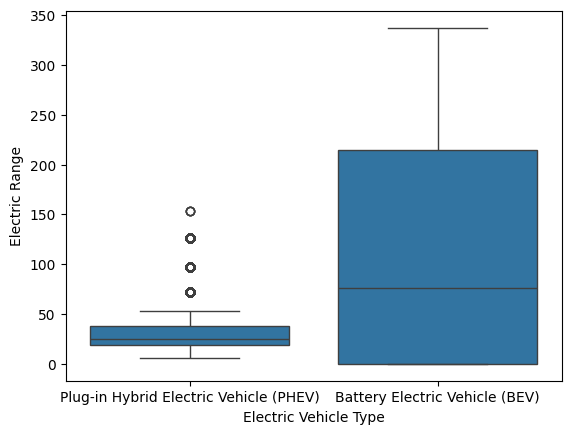

In [22]:
import seaborn as sns
sns.boxplot(x='Electric Vehicle Type', y='Electric Range', data=df)

**Average electric range by state**

<Axes: title={'center': 'Average Electric Range by State'}, ylabel='State'>

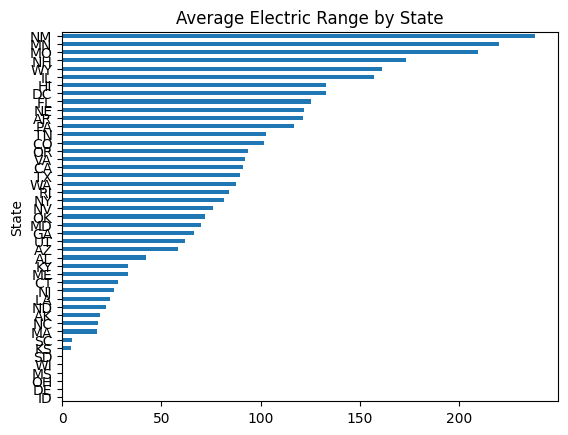

In [23]:
range_by_state = df.groupby('State')['Electric Range'].mean().sort_values()
range_by_state.plot(kind='barh', title='Average Electric Range by State')



**Top 10 States By EV range**

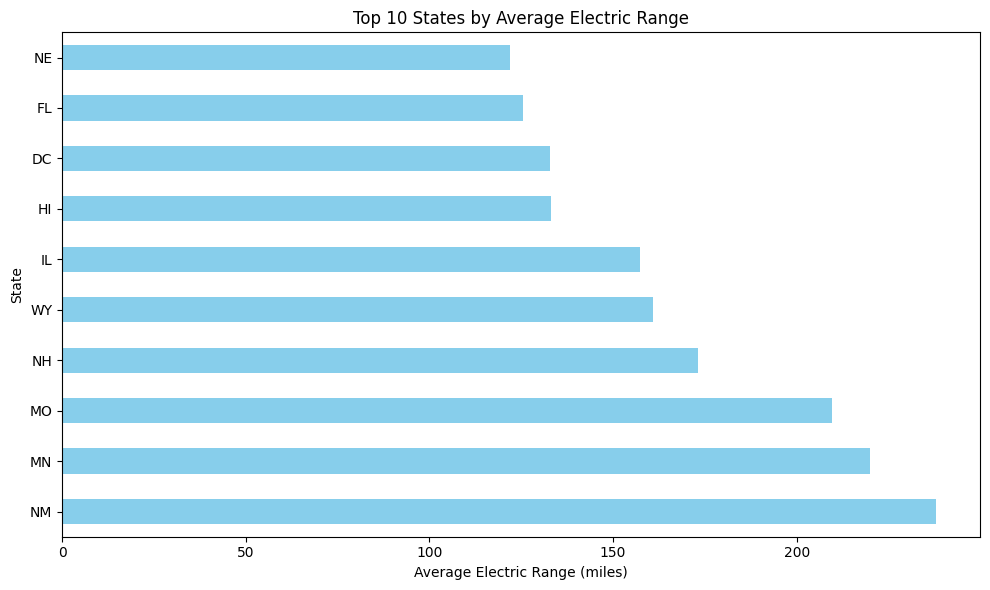

In [26]:
import matplotlib.pyplot as plt
#average electric range by state
range_by_state = df.groupby('State')['Electric Range'].mean().sort_values(ascending=False)
#top 10 states
top_states = range_by_state.head(10)

plt.figure(figsize=(10, 6))
top_states.plot(kind='barh', color='skyblue', title='Top 10 States by Average Electric Range')
plt.xlabel('Average Electric Range (miles)')
plt.ylabel('State')
plt.title('Top 10 States by Average Electric Range')
plt.tight_layout()  
plt.show()


**Categorical - Categorical**
* Using stacked bar plot

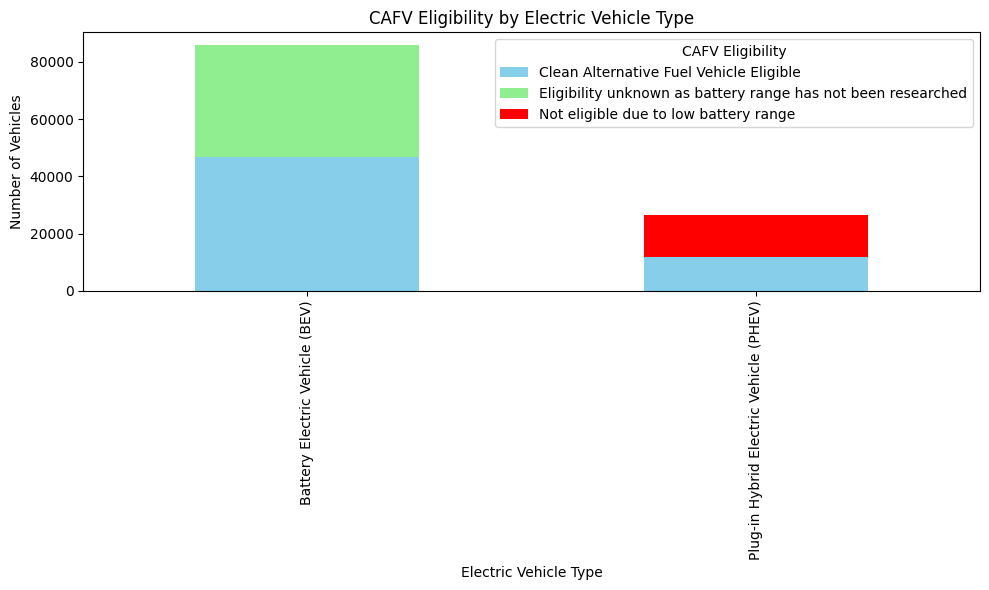

In [27]:
# Calculate the value counts for Electric Vehicle Type and CAFV Eligibility
stacked_data = df.groupby(['Electric Vehicle Type', 'Clean Alternative Fuel Vehicle (CAFV) Eligibility'])['VIN (1-10)'].count().unstack()

stacked_data.plot(kind='bar', stacked=True, figsize=(10, 6), color=['skyblue', 'lightgreen','red'])
plt.title('CAFV Eligibility by Electric Vehicle Type')
plt.ylabel('Number of Vehicles')
plt.xlabel('Electric Vehicle Type')
plt.legend(title='CAFV Eligibility')
plt.tight_layout()
plt.show()


# Task 2: Choropleth Animation

**Number of EV vehicles based on location**

   State  EV Count
42    WA    112348
4     CA        76
41    VA        36
18    MD        26
39    TX        14


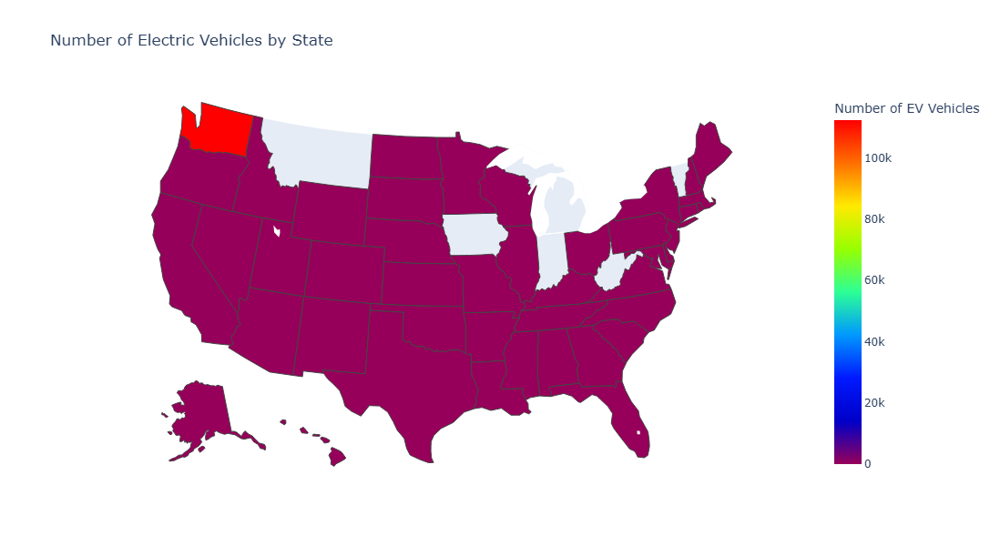

In [25]:
import pandas as pd
import plotly.express as px

# Assuming you have your DataFrame 'df' already prepared
state_evcount = df.groupby('State')['VIN (1-10)'].count().reset_index() 
state_evcount.columns = ['State', 'EV Count']

# Sort the DataFrame by 'EV Count' in descending order and get the top 5 states
top_states = state_evcount.sort_values(by='EV Count', ascending=False).head(5)

# Print the top 5 states with the highest number of EVs
print(top_states)

# Create the choropleth map with increased width and height
fig = px.choropleth(
    state_evcount,
    locations='State',
    locationmode='USA-states', 
    color='EV Count',
    color_continuous_scale='rainbow',
    scope='usa',
    labels={'EV Count': 'Number of EV Vehicles'}, 
    title='Number of Electric Vehicles by State',
    width=1000,  # Increase the width here
    height=600   # Increase the height here
)

# Show the figure
fig.show()


#  Task 3: Racing Bar Plot

**EV makes count with years**

In [19]:
# Grouping the data by 'Model Year' and 'Make', then counting the occurrences
ev_make_counts = df.groupby(['Model Year', 'Make']).size().unstack().fillna(0)

# Transpose the DataFrame for better readability (years as rows, makes as columns)
ev_make_counts_transposed = ev_make_counts.T

# Fill any NaN values with 0 (if some makes are missing in a particular year)
ev_make_counts_transposed = ev_make_counts_transposed.fillna(0)

# Display the table with all EV makes and their counts for each year
ev_make_counts_transposed


Model Year,1997,1998,1999,2000,2002,2008,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Make,,,,,,,,,,,,,,,,,,,,
AUDI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,214.0,187.0,174.0,392.0,224.0,544.0,585.0,12.0
AZURE DYNAMICS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BENTLEY,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
BMW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,457.0,403.0,383.0,692.0,710.0,279.0,143.0,635.0,905.0,73.0
CADILLAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,58.0,0.0,18.0,15.0,17.0,0.0,0.0,0.0,0.0,0.0
CHEVROLET,1.0,0.0,0.0,0.0,0.0,0.0,0.0,71.0,496.0,818.0,724.0,467.0,309.0,2744.0,1126.0,966.0,1014.0,377.0,892.0,177.0
CHRYSLER,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,94.0,554.0,119.0,286.0,504.0,237.0,0.0
FIAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,106.0,97.0,242.0,148.0,167.0,53.0,9.0,0.0,0.0,0.0,0.0
FISKER,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Max EV count by different makes and years**

In [23]:
import pandas as pd

# Assuming 'df' is your original DataFrame and you have already grouped and transposed it
# Grouping the data by 'Model Year' and 'Make', then counting the occurrences
ev_make_counts = df.groupby(['Model Year', 'Make']).size().unstack().fillna(0)

# Transpose the DataFrame for better readability (years as rows, makes as columns)
ev_make_counts_transposed = ev_make_counts.T

# Fill any NaN values with 0 (if some makes are missing in a particular year)
ev_make_counts_transposed = ev_make_counts_transposed.fillna(0)

# Calculate the maximum value for each make (row) and the corresponding year
most_ev = ev_make_counts_transposed.max(axis=1)
most_ev_year = ev_make_counts_transposed.idxmax(axis=1)

# Create a new DataFrame for max values and the corresponding years
max_values_years_df = pd.DataFrame({
    'ev make': ev_make_counts_transposed.index,
    'most_Ev': most_ev,
    'year_of_max': most_ev_year
})

# Display the new DataFrame
print(max_values_years_df)


                       ev make  most_Ev  year_of_max
Make                                                
AUDI                      AUDI    585.0         2022
AZURE DYNAMICS  AZURE DYNAMICS      4.0         2011
BENTLEY                BENTLEY      1.0         2020
BMW                        BMW    905.0         2022
CADILLAC              CADILLAC     58.0         2014
CHEVROLET            CHEVROLET   2744.0         2017
CHRYSLER              CHRYSLER    554.0         2018
FIAT                      FIAT    242.0         2015
FISKER                  FISKER     20.0         2012
FORD                      FORD   1250.0         2022
GENESIS                GENESIS     18.0         2023
HONDA                    HONDA    614.0         2018
HYUNDAI                HYUNDAI    633.0         2022
JAGUAR                  JAGUAR    120.0         2019
JEEP                      JEEP    629.0         2021
KIA                        KIA   2153.0         2022
LAND ROVER          LAND ROVER     30.0       

# Racing Bar Plot

In [32]:

import bar_chart_race as bcr

ev_make_counts = df.groupby(['Model Year', 'Make']).size().unstack().fillna(0)
bcr.bar_chart_race(
    df=ev_make_counts, 
    orientation="h",
    sort='desc',
    title= 'EV Make Count Over the Years',
    steps_per_period=100,
    period_length=2000,
    period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 72, 'weight': 'semibold'}, 
    bar_kwargs={'alpha': .99, 'lw': 0},
    period_fmt="{x:.0f}")

C:\Users\SANKET\AppData\Local\Programs\Python\Python312\Lib\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\SANKET\AppData\Local\Programs\Python\Python312\Lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\SANKET\AppData\Local\Programs\Python\Python312\Lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

